In [57]:
# import libraries
import sys, os

# # Add the src directory to sys.path
# src_path = os.path.join(os.path.dirname(__file__), 'src')
# sys.path.append(src_path)

import numpy as np
import pandas as pd
import shelve
import importlib
from src.neuron import *
from src.utils import *
from src.constants import * 
from src.network import *
from src.validation import *
from src.viz import *
from src.genetic_algorithm import *
from copy import copy
from datetime import datetime
from IPython.display import display, HTML

file_path = '/Users/stevenwendel/Documents/GitHub/bg/data/E_2025-02-11_13-25-09.pkl'

def pickle_to_dataframe(path):
    # Collect data in a list
    ga_raw = pickle.load(open(path, 'rb'))
    data = []
    
    for gen, runs in ga_raw.items():
        for run in runs:
            data.append([gen, run['dna'], run['dna_score']])
            
    # Create DataFrame in one go
    df = pd.DataFrame(data, columns=['generation', 'dna', 'dna_score'])

    # Sort the DataFrame (not the transposed version)
    ga_results = df.sort_values(by='dna_score', ascending=False, ignore_index=True)
    return ga_results

ga_results=pickle_to_dataframe(file_path)
display(ga_results)



,generation,dna,dna_score
0,186,"[629, -92, -24, 626, -11, -1012, -4, -2000, -1...",945
1,195,"[629, -92, -24, 626, -11, -1012, -4, -2000, -1...",945
2,193,"[629, -92, -24, 626, -11, -1012, -4, -2000, -1...",945
3,183,"[629, -92, -24, 626, -11, -1012, -4, -2000, -1...",945
4,185,"[629, -92, -24, 626, -11, -1012, -4, -2000, -1...",945
...,...,...,...
599995,140,"[1990, 2, -328, 390, -52, -386, -9, -1326, -4,...",442
599996,115,"[878, -207, -223, 377, -56, -460, -13, -133, -...",427
599997,127,"[961, -202, -94, 567, -223, -131, -5, -1022, -...",415
599998,140,"[706, -68, -47, 313, -46, -2000, -4, -63, -381...",405


In [58]:
## Counting unique configurations

import pandas as pd

# Assuming ga_results is your DataFrame
qualifier_depth = 1000
max_synapses = 18

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Dictionary to store unique configurations and their details
unique_configs = {}
for index, row in ga_results.head(qualifier_depth).iterrows():
    config = dna_to_nonzero_config(row['dna'])
    # Calculate the number of non-zero entries
    non_zero_count = sum(config)
    # Only consider configurations with non-zero counts of 18 or lower
    if non_zero_count <= max_synapses and config not in unique_configs:
        # Store the index, dna_score, and non-zero count
        unique_configs[config] = {
            'index': index,
            'dna_score': row['dna_score'],
            'non_zero_count': non_zero_count
        }

# Print the unique configurations with their details
for config, details in unique_configs.items():
    print(f"Configuration: {config}, Details: {details}")

In [59]:
import pandas as pd
import numpy as np

# Assuming ga_results is your DataFrame
# Sort by dna_score to get the top 100 scoring DNA
top_100 = ga_results.nlargest(100, 'dna_score')

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Initialize a list to count non-zero occurrences for each position
non_zero_counts = np.zeros(len(top_100.iloc[0]['dna']))

# Initialize a list to sum weights for each position
weight_sums = np.zeros(len(top_100.iloc[0]['dna']))

# Iterate over each DNA list
for index, row in top_100.iterrows():
    dna = row['dna']
    for i, weight in enumerate(dna):
        if weight != 0:
            non_zero_counts[i] += 1
            weight_sums[i] += weight

# Calculate the threshold for 90% presence
threshold = 0.9 * len(top_100)

# Identify positions that are non-zero in 90% or more of the DNA lists
always_on_positions = [i for i, count in enumerate(non_zero_counts) if count >= threshold]

# Calculate average weights for these positions
average_weights = {i: weight_sums[i] / non_zero_counts[i] for i in always_on_positions}

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Map positions to synapses
always_on_synapses = [(ACTIVE_SYNAPSES[i], average_weights[i]) for i in always_on_positions]

# Print the results
print("Synapses that are almost always on (90% or more) in the top 100 scoring DNA:")
for synapse, avg_weight in always_on_synapses:
    print(f"{synapse}: Avg Weight = {avg_weight:.1f}")

Synapses that are almost always on (90% or more) in the top 100 scoring DNA:
['Somat', 'ALMprep']: Avg Weight = 1425.6
['Somat', 'ALMinter']: Avg Weight = -127.0
['Somat', 'ALMresp']: Avg Weight = -109.4
['Somat', 'MSN1']: Avg Weight = 306.7
['MSN1', 'SNR1']: Avg Weight = -88.8
['MSN1', 'SNR2']: Avg Weight = -1724.2
['MSN1', 'SNR3']: Avg Weight = -11.3
['MSN2', 'SNR1']: Avg Weight = -1276.4
['MSN2', 'SNR2']: Avg Weight = -115.0
['MSN2', 'SNR3']: Avg Weight = -261.4
['MSN3', 'SNR1']: Avg Weight = -185.9
['MSN3', 'SNR2']: Avg Weight = -674.2
['MSN3', 'SNR3']: Avg Weight = -94.1
['SNR1', 'VMprep']: Avg Weight = -58.4
['SNR1', 'VMresp']: Avg Weight = -908.4
['SNR2', 'VMprep']: Avg Weight = -148.3
['SNR2', 'VMresp']: Avg Weight = -11.8
['SNR3', 'VMprep']: Avg Weight = -8.4
['SNR3', 'VMresp']: Avg Weight = -160.3
['VMprep', 'ALMprep']: Avg Weight = 52.9
['VMprep', 'ALMinter']: Avg Weight = -5.5
['VMprep', 'ALMresp']: Avg Weight = -99.1
['VMresp', 'ALMprep']: Avg Weight = 263.1
['VMresp', 'AL

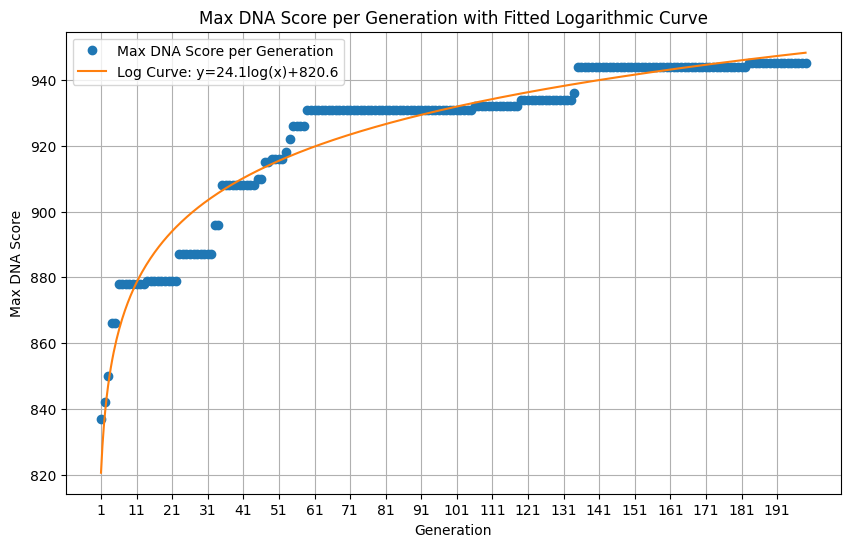

The equation of the fitted curve is: y = 24.12 * log(x) + 820.61


In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df=ga_results
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and find the max 'dna_score' for each group
max_scores_per_generation = df.groupby('generation')['dna_score'].max().reset_index()

# Extract the data for fitting
x = max_scores_per_generation['generation'][1:]
y = max_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)
a,b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Max DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Log Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Max DNA Score')
plt.title('Max DNA Score per Generation with Fitted Logarithmic Curve')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()


# Print the equation of the curve
print(f"The equation of the fitted curve is: y = {a:.2f} * log(x) + {b:.2f}")

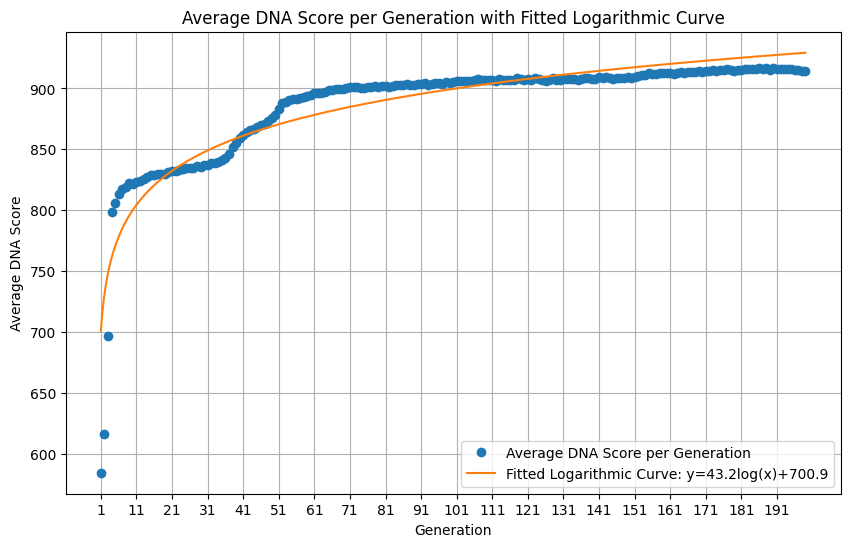

The equation of the fitted curve is: y = 43.15 * log(x) + 700.95


In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and calculate the average 'dna_score' for each group
average_scores_per_generation = df.groupby('generation')['dna_score'].mean().reset_index()

# Extract the data for fitting
x = average_scores_per_generation['generation'][1:]
y = average_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)

# Extract parameters
a, b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Average DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Fitted Logarithmic Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average DNA Score')
plt.title('Average DNA Score per Generation with Fitted Logarithmic Curve')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()

# Print the equation of the curve
print(f"The equation of the fitted curve is: y = {a:.2f} * log(x) + {b:.2f}")

Number of synapses: 49


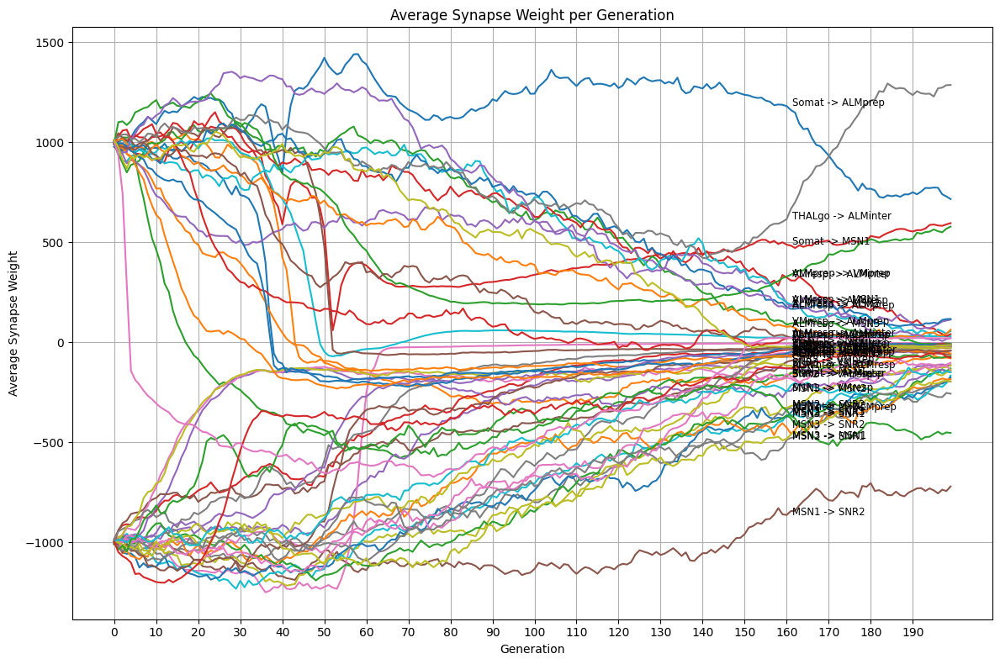

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]

# Plotting
plt.figure(figsize=(12, 8))

# Plot each synapse's average weight over generations
for i in range(num_synapses):  # Use the actual number of synapses
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[i], label=synapse_labels[i])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(average_weights_per_generation.shape[0]*.8)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[i],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[i][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average Synapse Weight')
plt.title('Average Synapse Weight per Generation')

# Set sparse tick marks
plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()

In [55]:
best_run = ga_results.iloc[0]

# Create a labeled Series for the best run's DNA
best_run_labeled = pd.Series(best_run['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])
non_zero_count = (best_run_labeled != 0).sum()

display(best_run_labeled)
len(best_run_labeled)
print(non_zero_count)

Somat -> ALMprep       372
Somat -> ALMinter      103
Somat -> ALMresp       204
Somat -> MSN1          212
MSN1 -> SNR1          -332
MSN1 -> SNR2          -369
MSN1 -> SNR3          -103
MSN2 -> SNR1          -135
MSN2 -> SNR2          -142
MSN2 -> SNR3            -1
MSN3 -> SNR1           -19
MSN3 -> SNR2          -185
MSN3 -> SNR3          -198
SNR1 -> VMprep        -387
SNR1 -> VMresp        -158
SNR2 -> VMprep        -294
SNR2 -> VMresp         -22
SNR3 -> VMprep        -140
SNR3 -> VMresp        -400
VMprep -> ALMprep       51
VMprep -> ALMinter      43
VMprep -> ALMresp       -5
VMresp -> ALMprep      119
VMresp -> ALMinter     226
VMresp -> ALMresp       79
ALMprep -> MSN2        236
ALMinter -> MSN1       -52
ALMinter -> MSN2      -156
ALMinter -> MSN3      -202
ALMresp -> MSN1        387
ALMresp -> MSN2        248
ALMresp -> MSN3         83
ALMprep -> VMprep      143
ALMresp -> VMresp      354
MSN1 -> MSN2           -21
MSN1 -> MSN3          -345
MSN2 -> MSN1          -198
M

49


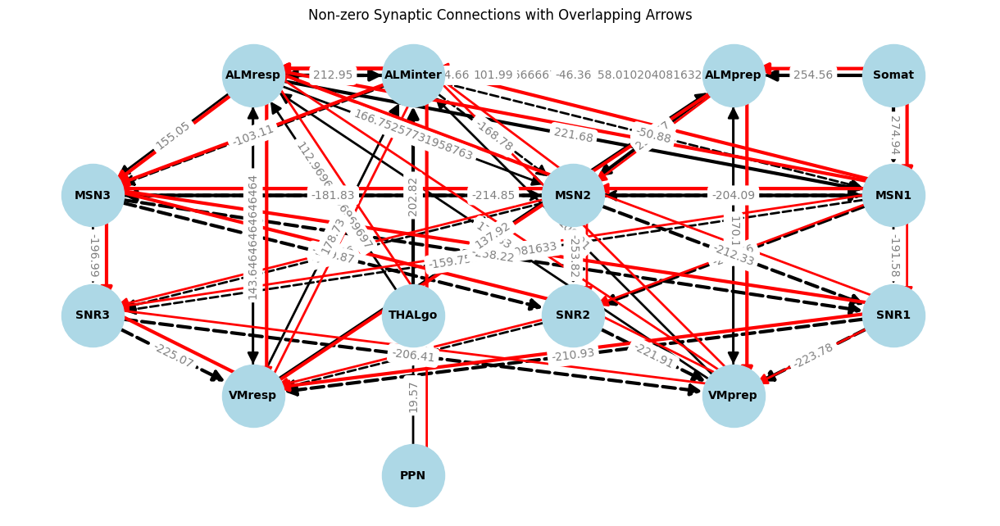

In [56]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Create a labeled Series for the best run's DNA
best_run_labeled = pd.Series(ga_results.iloc[0]['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])

# Create a graph
G = nx.DiGraph()

# Add nodes for each neuron
G.add_nodes_from(NEURON_NAMES)

# Add edges for non-zero synaptic connections
for synapse, weight in best_run_labeled.items():
    if weight != 0:
        source, target = synapse.split(' -> ')
        G.add_edge(source, target, weight=weight)

# Define custom positions for each node
custom_pos = {
    'Somat': (5, 5),
    'MSN1': (5, 3.5),
    'MSN2': (3, 3.5),
    'MSN3': (0, 3.5),
    'SNR1': (5, 2),
    'SNR2': (3, 2),
    'SNR3': (0, 2),
    'ALMinter': (2, 5),
    'PPN': (2, 0),
    'THALgo': (2, 2),
    'VMprep': (4, 1),
    'ALMprep': (4, 5),
    'ALMresp': (1, 5),
    'VMresp': (1, 1)
}

# Define a function to determine the width of each edge
def get_edge_width(weight):
    return np.ceil(abs(weight) / 200) + 1

# Define a function to determine the style of each edge
def get_edge_style(weight):
    return 'dashed' if weight < 0 else 'solid'

# Add these connections to the graph
for (source, target), avg_weight in always_on_synapses:
    G.add_edge(source, target, weight=avg_weight)

# Draw the main graph using the custom positions
plt.figure(figsize=(12, 6))
edges = G.edges(data=True)
nx.draw(G, pos=custom_pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=10, font_weight='bold', arrowsize=20,
        width=[get_edge_width(data['weight']) for _, _, data in edges],
        style=[get_edge_style(data['weight']) for _, _, data in edges],
        edge_color='black')  # Default edge color

# Create a slightly offset position for the overlapping arrows
offset = 0.085  # Adjust this value to control the offset distance
offset_pos = {node: (x + offset, y + offset) for node, (x, y) in custom_pos.items()}

# Draw overlapping arrows for specific connections in always_on_synapses
G_overlap = nx.DiGraph()
G_overlap.add_edges_from([(source, target) for (source, target), _ in always_on_synapses])

# Calculate widths based on avg_weight
overlap_widths = [get_edge_width(avg_weight) for (_, _), avg_weight in always_on_synapses]

# Draw these edges with a smaller size and red color, including arrowheads
nx.draw_networkx_edges(G_overlap, pos=offset_pos, edge_color='red', arrows=True, arrowsize=20, width=overlap_widths)

# Add edge labels
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos=custom_pos, edge_labels=edge_labels, font_color='gray')

plt.title('Non-zero Synaptic Connections with Overlapping Arrows')
plt.show()

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

unique_configs[config] = {
    'index': index,
    'dna_score': row['dna_score'],
    'non_zero_count': non_zero_count
}

# Print the unique configurations with their details
for config, details in unique_configs.items():
    print(f"Configuration: {config}, Details: {details}")
    if details['non_zero_count'] < 18:
        # Create a labeled Series for the best run's DNA
        best_run_labeled = pd.Series(ga_results.iloc[details['index']]['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])

        # Create a graph
        G = nx.DiGraph()

        # Add nodes for each neuron
        G.add_nodes_from(NEURON_NAMES)

        # Add edges for non-zero synaptic connections
        for synapse, weight in best_run_labeled.items():
            if weight != 0:
                source, target = synapse.split(' -> ')
                G.add_edge(source, target, weight=weight)

        # Define custom positions for each node
        custom_pos = {
            'Somat': (5, 5),
            'MSN1': (5, 3),
            'MSN2': (3, 3),
            'MSN3': (0, 3),
            'SNR1': (5, 2),
            'SNR2': (3, 2),
            'SNR3': (0, 2),
            'ALMinter': (2, 5),
            'PPN': (2, 0),
            'THALgo': (2, 2),
            'VMprep': (4, 1),
            'ALMprep': (4,5),
            'ALMresp': (1, 5),
            'VMresp': (1, 1)
        }

        # Draw the graph using the custom positions
        plt.figure(figsize=(12, 6))
        nx.draw(G, pos=custom_pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=10, font_weight='bold', arrowsize=20)
        edge_labels = nx.get_edge_attributes(G, 'weight')
        nx.draw_networkx_edge_labels(G, pos=custom_pos, edge_labels=edge_labels, font_color='red')
        plt.title('Non-zero Synaptic Connections')
        plt.show()
    else:
        print(f"This configuration has {details['non_zero_count']} non-zero synapses.")

In [63]:
best_run_GA = best_run['dna']
second_best_run_GA = ga_results.iloc[1]['dna']
third_best_run_GA = ga_results.iloc[2]['dna']

curr_dna = ga_results.iloc[1]['dna']

# Load DNA
dna_matrix = load_dna(curr_dna)


# === Preparing Network === 
all_neurons = create_neurons()
splits, input_waves, alpha_array = create_experiment()
criteria_dict = define_criteria()
max_score = TMAX//BIN_SIZE * len(CRITERIA_NAMES)

dna_score, neuron_data = evaluate_dna(
                dna_matrix=dna_matrix,
                neurons=all_neurons,
                alpha_array=alpha_array,
                input_waves=input_waves,
                criteria=criteria_dict,
                curr_dna=curr_dna
                )
total_score = sum(dna_score.values())
print(f'    === DNA: {curr_dna}') 
print(f'    === Control: {dna_score["control"]}/{max_score}')
print(f'    === Experimental: {dna_score["experimental"]}/{max_score}')
print(f'    === Overall: {total_score}({total_score/(2*max_score):.2%})')
print('\n')
"""
neuron_data = {
    'experimental': {
        'neuron_name': {
            'hist_V': np.array(),
            'spike_times': np.array()
        },
    'control': {
        'neuron_name': {
            'hist_V': np.array(),
            'spike_times': np.array()
        }
    }
}
"""

diagnostic = {
        'show_dna_matrix' : True,
        'show_neuron_plots' : True,
        'show_difference_histogram' : False,
        'show_dna_scores': True
    }


if diagnostic['show_dna_matrix']:
                print("Currently loaded matrix ---")
                display_matrix(dna_matrix, NEURON_NAMES)

if diagnostic['show_dna_scores']:
                print(f'{dna_score=}: {curr_dna}')
            
if diagnostic['show_neuron_plots']:
                for condition in ['experimental', 'control']:
                    target_neurons_hist_Vs = np.array([neuron_data[condition][name]['hist_V'] for name in NEURON_NAMES])
                    plot_neurons_interactive(hist_Vs=target_neurons_hist_Vs, neuron_names=NEURON_NAMES, sq_wave=input_waves[0], go_wave=input_waves[1], show_u=False)
                    

    === DNA: [629, -92, -24, 626, -11, -1012, -4, -2000, -14, -78, -12, -113, -167, -69, -2, -10, -34, -24, -36, 32, -7, -43, -14, -18, -5, -26, -8, -89, -37, -20, -105, 0, 419, -63, -4, -20, -316, -2000, -286, -193, -3, -211, -37, -833, -8, -12, 44, 1999, -11]
    === Control: 496/500
    === Experimental: 449/500
    === Overall: 945(94.50%)


Currently loaded matrix ---


,Somat,MSN1,SNR1,VMprep,ALMprep,MSN2,SNR2,PPN,THALgo,ALMinter,MSN3,SNR3,ALMresp,VMresp
Somat,0.0,626.0,0.0,0.0,629.0,0.0,0.0,0.0,0.0,-92.0,0.0,0.0,-24.0,0.0
MSN1,0.0,0.0,-11.0,0.0,0.0,-4.0,-1012.0,0.0,0.0,0.0,-20.0,-4.0,0.0,0.0
SNR1,0.0,0.0,0.0,-69.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.0
VMprep,0.0,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,-7.0,0.0,0.0,-43.0,0.0
ALMprep,0.0,0.0,0.0,419.0,0.0,-26.0,0.0,0.0,0.0,-3.0,0.0,0.0,-211.0,0.0
MSN2,0.0,-316.0,-2000.0,0.0,0.0,0.0,-14.0,0.0,0.0,0.0,-2000.0,-78.0,0.0,0.0
SNR2,0.0,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-34.0
PPN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,0.0,0.0,0.0,0.0,0.0
THALgo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1999.0,0.0,0.0,-11.0,0.0
ALMinter,0.0,-8.0,0.0,0.0,-37.0,-89.0,0.0,0.0,0.0,0.0,-37.0,0.0,-833.0,0.0


dna_score={'experimental': 449, 'control': 496}: [629, -92, -24, 626, -11, -1012, -4, -2000, -14, -78, -12, -113, -167, -69, -2, -10, -34, -24, -36, 32, -7, -43, -14, -18, -5, -26, -8, -89, -37, -20, -105, 0, 419, -63, -4, -20, -316, -2000, -286, -193, -3, -211, -37, -833, -8, -12, 44, 1999, -11]
hist_Vs=array([[ -60.        ,  -60.        ,  -60.        , ...,  -60.        ,
         -60.        ,  -60.        ],
       [ -80.        ,  -78.6       ,  -78.7008    , ...,  -55.        ,
          40.        ,  -55.        ],
       [ -60.        ,  -58.8       ,  -57.75792   , ...,  -50.        ,
          35.        ,  -50.        ],
       ...,
       [ -60.        ,  -58.8       ,  -57.75792   , ..., -171.51893038,
        -170.97924422, -171.51893038],
       [ -60.        ,  -60.        ,  -60.        , ...,  -60.        ,
         -60.        ,  -60.        ],
       [ -60.        ,  -60.        ,  -60.        , ...,  -97.9311974 ,
         -97.9495358 ,  -97.9311974 ]])
neuron_na

hist_Vs=array([[-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-80.        , -78.6       , -78.7008    , ..., -77.87066959,
        -77.87066812, -77.87066666],
       [-60.        , -58.8       , -57.75792   , ..., -50.974306  ,
        -51.14393419, -51.28534357],
       ...,
       [-60.        , -58.8       , -57.75792   , ..., -50.26860634,
        -50.50764944, -50.71736836],
       [-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-60.        , -60.        , -60.        , ..., -65.31787187,
        -65.38877005, -65.48282022]])
neuron_names=['Somat', 'MSN1', 'SNR1', 'VMprep', 'ALMprep', 'MSN2', 'SNR2', 'PPN', 'THALgo', 'ALMinter', 'MSN3', 'SNR3', 'ALMresp', 'VMresp']
